In [1]:
!pip install opendatasets

In [2]:
import opendatasets as od

od.download("https://www.kaggle.com/datasets/mertsonmezer/self-driving-car-data")

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: syedosamaalishah092
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/mertsonmezer/self-driving-car-data


100%|██████████| 434M/434M [00:27<00:00, 16.8MB/s]


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

import keras
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from tensorflow.keras.optimizers import Adam

from sklearn.model_selection import train_test_split

from imgaug import augmenters as iaa
import cv2

import os
import random

import warnings
warnings.filterwarnings('ignore')

In [4]:
# import data

data = pd.read_csv("/content/self-driving-car-data/Self-driving Car Dataset/driving_log.csv")
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2022_09_18_12_03_15_935.jpg,left_2022_09_18_12_03_15_935.jpg,right_2022_09_18_12_03_15_935.jpg,0.000000,0.0,0.0,0.000080
1,center_2022_09_18_12_03_16_749.jpg,left_2022_09_18_12_03_16_749.jpg,right_2022_09_18_12_03_16_749.jpg,-0.060888,1.0,0.0,3.214743
2,center_2022_09_18_12_03_16_956.jpg,left_2022_09_18_12_03_16_956.jpg,right_2022_09_18_12_03_16_956.jpg,-0.052751,1.0,0.0,5.779959
3,center_2022_09_18_12_03_17_057.jpg,left_2022_09_18_12_03_17_057.jpg,right_2022_09_18_12_03_17_057.jpg,-0.197497,1.0,0.0,6.913286
4,center_2022_09_18_12_03_17_262.jpg,left_2022_09_18_12_03_17_262.jpg,right_2022_09_18_12_03_17_262.jpg,-0.095900,1.0,0.0,9.172904


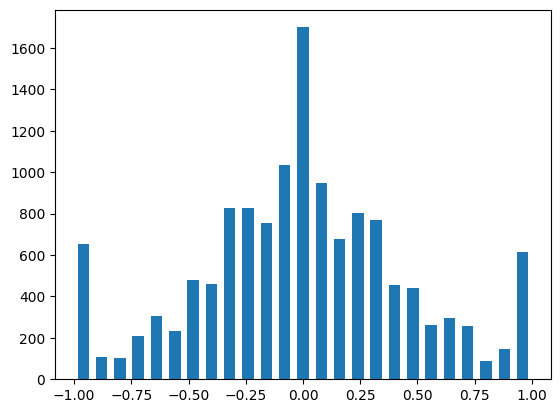

In [5]:
# visualize data

n_bins = 25

hist, bins = np.histogram(data['steering'], n_bins)
center = (bins[:-1] + bins[1:]) * 0.5

plt.bar(center, hist, width = 0.05)
plt.show()

In [6]:
# import images

datadir = "/content/self-driving-car-data/Self-driving Car Dataset"

def load_img_steering(datadir, data):
    image_paths = list()
    steerings = list()

    for i in range(len(data)):
        indexed_data = data.iloc[i]
        center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]

        image_paths.append(os.path.join(datadir, center.strip()))
        steerings.append(float(indexed_data[3]))

    image_paths = np.asarray(image_paths)
    steerings = np.asarray(steerings)

    return image_paths, steerings


image_paths, steerings = load_img_steering(datadir + '/IMG', data)

for i in range(5):
    print("Path: {}".format(image_paths[i]))
    print("Steering: {}".format(steerings[i]))

Path: /content/self-driving-car-data/Self-driving Car Dataset/IMG/center_2022_09_18_12_03_15_935.jpg
Steering: 0.0
Path: /content/self-driving-car-data/Self-driving Car Dataset/IMG/center_2022_09_18_12_03_16_749.jpg
Steering: -0.06088828
Path: /content/self-driving-car-data/Self-driving Car Dataset/IMG/center_2022_09_18_12_03_16_956.jpg
Steering: -0.0527508
Path: /content/self-driving-car-data/Self-driving Car Dataset/IMG/center_2022_09_18_12_03_17_057.jpg
Steering: -0.1974975
Path: /content/self-driving-car-data/Self-driving Car Dataset/IMG/center_2022_09_18_12_03_17_262.jpg
Steering: -0.0959001


In [7]:
# create train and validation cases.

X_train, X_val, y_train, y_val = train_test_split(image_paths, steerings, test_size=0.2, random_state=8)

print('Training Samples: {}\nValidation Samples: {}'.format(len(X_train), len(X_val)))

Training Samples: 10764
Validation Samples: 2691


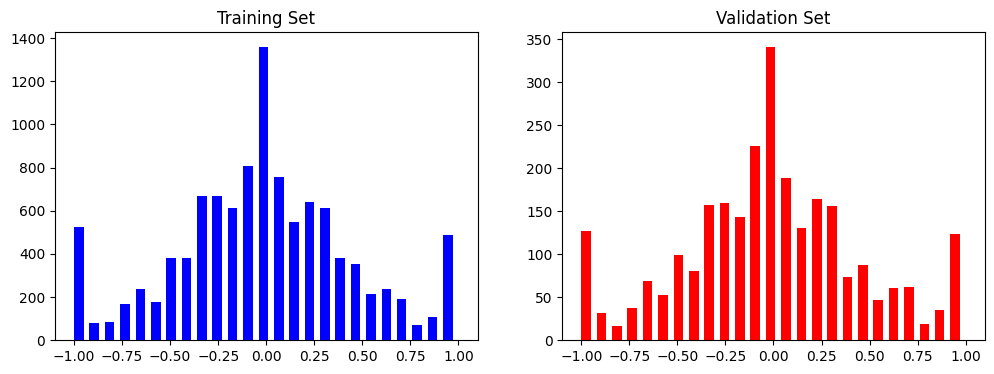

In [8]:
# visualize train and test cases

fig, ax = plt.subplots(1, 2, figsize = (12,4))

ax[0].hist(y_train, bins = n_bins, width = 0.05, color = 'blue')
ax[0].set_title('Training Set')

ax[1].hist(y_val, bins=n_bins, width = 0.05, color='red')
ax[1].set_title('Validation Set')

plt.show()

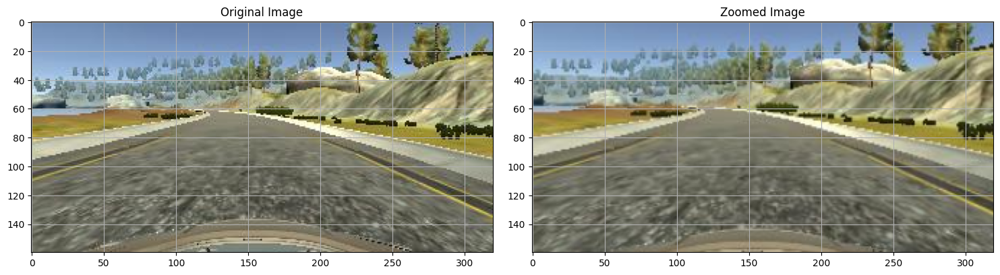

In [9]:
def zoom(image):
    zoom = iaa.Affine(scale = (1, 1.3))
    image = zoom.augment_image(image)
    return image


image = image_paths[100]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, ax = plt.subplots(1, 2, figsize = (15,10))
fig.tight_layout()

ax[0].imshow(original_image)
ax[0].set_title('Original Image')
ax[0].grid()

ax[1].imshow(zoomed_image)
ax[1].set_title('Zoomed Image')
ax[1].grid()

plt.show()

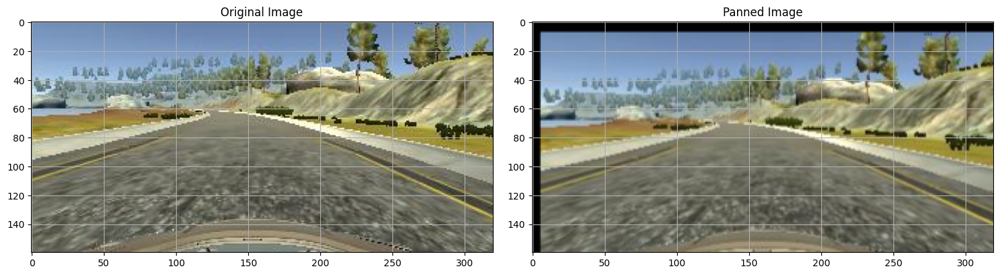

In [10]:
def pan(image):
    pan = iaa.Affine(translate_percent={'x': (-0.1, 0.1), 'y': (-0.1, 0.1)})
    image = pan.augment_image(image)
    return image


image = image_paths[100]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, ax = plt.subplots(1, 2, figsize = (15,10))
fig.tight_layout()

ax[0].imshow(original_image)
ax[0].set_title('Original Image')
ax[0].grid()

ax[1].imshow(panned_image)
ax[1].set_title('Panned Image')
ax[1].grid()

plt.show()

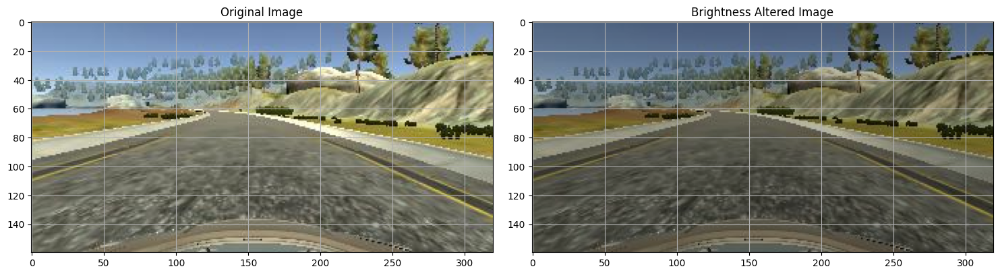

In [11]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image


image = image_paths[100]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, ax = plt.subplots(1, 2, figsize = (15,10))
fig.tight_layout()

ax[0].imshow(original_image)
ax[0].set_title('Original Image')
ax[0].grid()

ax[1].imshow(brightness_altered_image)
ax[1].set_title('Brightness Altered Image')
ax[1].grid()

plt.show()

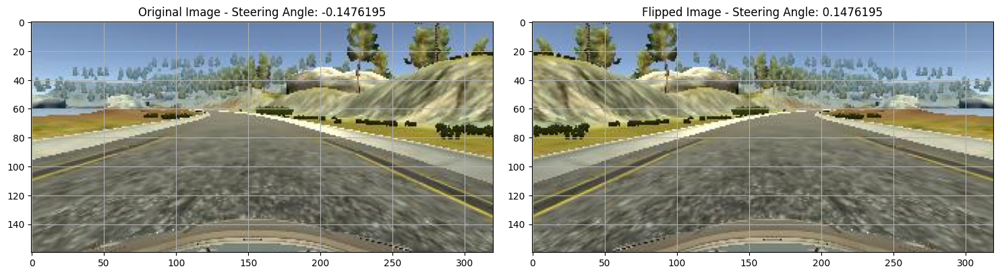

In [12]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image, 1)
    steering_angle = -steering_angle
    return image, steering_angle


image = image_paths[100]
steering_angle = steerings[100]
original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, ax = plt.subplots(1, 2, figsize = (15,10))
fig.tight_layout()

ax[0].imshow(original_image)
ax[0].set_title('Original Image - ' + 'Steering Angle: ' + str(steering_angle))
ax[0].grid()

ax[1].imshow(flipped_image)
ax[1].set_title('Flipped Image - ' + 'Steering Angle: ' + str(flipped_steering_angle))
ax[1].grid()

plt.show()

In [13]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)

    if np.random.rand() < 0.5:
        image = zoom(image)

    if np.random.rand() < 0.5:
        image = pan(image)

    if np.random.rand() < 0.5:
        image = img_random_brightness(image)

    if np.random.rand() < 0.5:
        image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

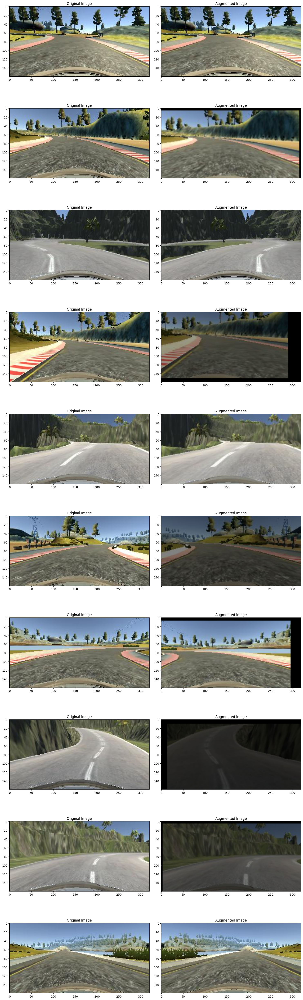

In [14]:
n_cols = 2
n_rows = 10

fig, ax = plt.subplots(n_rows, n_cols, figsize=(15, 50))
fig.tight_layout()

for i in range(n_rows):
    randnum = random.randint(0, len(image_paths) - 1)

    random_image = image_paths[randnum]
    random_steering = steerings[randnum]

    original_image = mpimg.imread(random_image)
    augmented_image, _ = random_augment(random_image, random_steering)

    ax[i][0].imshow(original_image)
    ax[i][0].set_title('Original Image')

    ax[i][1].imshow(augmented_image)
    ax[i][1].set_title('Augmented Image')

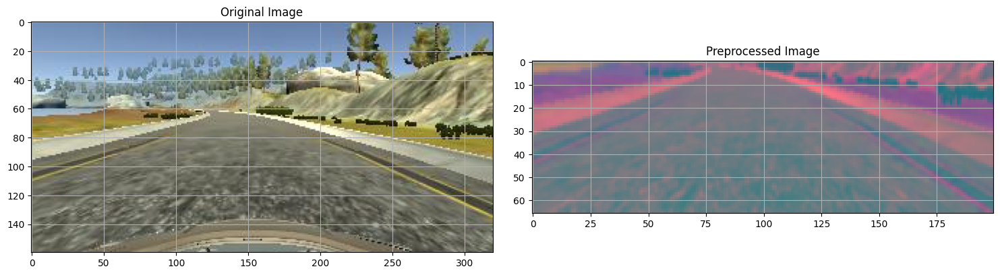

In [15]:
def img_preprocess(img):
    img = img[60:135, :, :]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3,3), 0)
    img = cv2.resize(img, (200, 66))
    img = img / 255.0
    return img


image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, ax = plt.subplots(1, 2, figsize = (15,10))
fig.tight_layout()

ax[0].imshow(original_image)
ax[0].set_title('Original Image')
ax[0].grid()

ax[1].imshow(preprocessed_image)
ax[1].set_title('Preprocessed Image')
ax[1].grid()

plt.show()

In [16]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):
    while True:
        batch_img = list()
        batch_steering = list()

        for i in range(batch_size):
            random_index = random.randint(0, len(image_paths) - 1)

            if istraining:
                img, steering = random_augment(image_paths[random_index], steering_ang[random_index])

            else:
                img = mpimg.imread(image_paths[random_index])
                steering = steering_ang[random_index]

            img = img_preprocess(img)
            batch_img.append(img)
            batch_steering.append(steering)

        yield (np.asarray(batch_img), np.asarray(batch_steering))

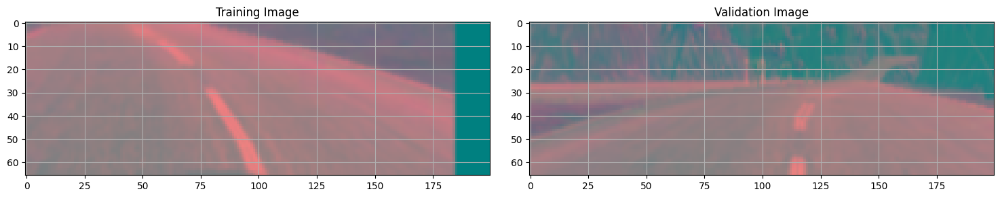

In [17]:
X_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
X_val_gen, y_val_gen = next(batch_generator(X_train, y_train, 1, 0))

fig, ax = plt.subplots(1, 2, figsize = (15,10))
fig.tight_layout()

ax[0].imshow(X_train_gen[0])
ax[0].set_title('Training Image')
ax[0].grid()

ax[1].imshow(X_val_gen[0])
ax[1].set_title('Validation Image')
ax[1].grid()

plt.show()

In [18]:
def nvidia_model():

    model = Sequential()

    model.add(Conv2D(24, (5, 5), strides = (2,2), input_shape = (66, 200, 3), activation = 'elu'))

    model.add(Conv2D(36, (5, 5), strides = (2,2), activation = 'elu'))

    model.add(Conv2D(48, (5, 5), strides = (2,2), activation = 'elu'))

    model.add(Conv2D(64, (3, 3), activation = 'elu'))

    model.add(Conv2D(64, (3, 3), activation = 'elu'))

    model.add(Flatten())

    model.add(Dense(100, activation = 'elu'))
    model.add(Dropout(0.5))

    model.add(Dense(50, activation = 'elu'))
    model.add(Dropout(0.5))

    model.add(Dense(10, activation = 'elu'))
    model.add(Dropout(0.5))

    model.add(Dense(1))

    model.compile(loss = 'mse', optimizer = Adam(learning_rate = 1e-4))

    return model

In [19]:
model = nvidia_model()

print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

In [20]:
history = model.fit(batch_generator(X_train, y_train, 64, 1),
                    steps_per_epoch = 600,
                    epochs = 10,
                    validation_data = batch_generator(X_val, y_val, 64, 0),
                    validation_steps = 400,
                    verbose = 1,
                    shuffle = 1)

Epoch 1/10
600/600 [==============================] - 144s 228ms/step - loss: 0.1856 - val_loss: 0.1261
Epoch 2/10
600/600 [==============================] - 136s 228ms/step - loss: 0.1554 - val_loss: 0.1221
Epoch 3/10
600/600 [==============================] - 137s 228ms/step - loss: 0.1510 - val_loss: 0.1167
Epoch 4/10
600/600 [==============================] - 137s 229ms/step - loss: 0.1445 - val_loss: 0.1085
Epoch 5/10
600/600 [==============================] - 137s 229ms/step - loss: 0.1433 - val_loss: 0.1062
Epoch 6/10
600/600 [==============================] - 135s 225ms/step - loss: 0.1389 - val_loss: 0.1084
Epoch 7/10
600/600 [==============================] - 136s 227ms/step - loss: 0.1372 - val_loss: 0.1068
Epoch 8/10
600/600 [==============================] - 133s 222ms/step - loss: 0.1365 - val_loss: 0.1095
Epoch 9/10
600/600 [==============================] - 118s 197ms/step - loss: 0.1322 - val_loss: 0.1064
Epoch 10/10
600/600 [==============================] - 119s 198m

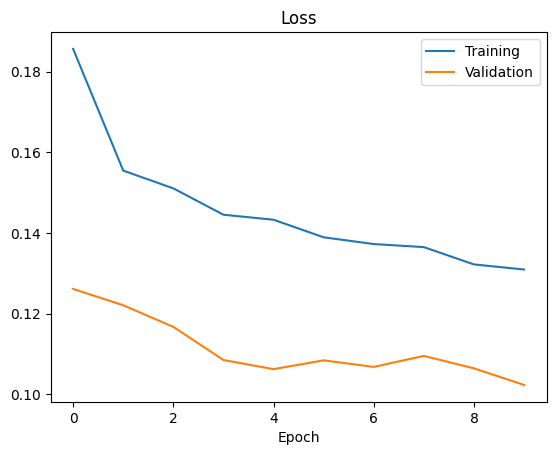

In [21]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['Training', 'Validation'])
plt.title('Loss')
plt.xlabel('Epoch')

plt.show()